<a href="https://colab.research.google.com/github/0x384c0/Experiments-MachineLearning/blob/master/collab/Analyzing_Amazon_Fine_Food_Reviews_with_TF_Hub_Universal_Encoder%2C_t_SNE_vizualisation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

 ## Amazon fine-food reviews dataset Clustering and Classification
 Base on OpenAI use case https://platform.openai.com/docs/guides/embeddings/use-cases

Setup

In [1]:
%%capture
!pip3 install seaborn

In [2]:
#@title Load the Universal Sentence Encoder's TF Hub module
from absl import logging

import tensorflow as tf

import tensorflow_hub as hub
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import re
import seaborn as sns

module_url = "https://tfhub.dev/google/universal-sentence-encoder/4" #@param ["https://tfhub.dev/google/universal-sentence-encoder/4", "https://tfhub.dev/google/universal-sentence-encoder-large/5"]
model = hub.load(module_url)
print ("module %s loaded" % module_url)

def embed(input):
  return model(input)

module https://tfhub.dev/google/universal-sentence-encoder/4 loaded


In [2]:
#@title Download DB from https://www.kaggle.com/datasets/snap/amazon-fine-food-reviews using link from Browser Dev console
#@markdown * Go to https://www.kaggle.com/datasets/snap/amazon-fine-food-reviews and signin in
#@markdown * Press Download
#@markdown * Cancel Download
#@markdown * Copy download link for file `archive.zip` from chrome://downloads/
#@markdown * Paste download to `db_download_link` param

db_download_link = "PASTE_LINK_HERE" #@param {type:"string"}

if not db_download_link.startswith('https://storage.googleapis.com/kaggle-data-sets/18/2157/bundle/archive.zip'):
  raise Exception("Invalid download link")

!curl '{db_download_link}' \
  -H 'authority: storage.googleapis.com' \
  -H 'accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/avif,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3;q=0.7' \
  -H 'accept-language: en-US,en;q=0.9,ru;q=0.8' \
  -H 'referer: https://www.kaggle.com/' \
  -H 'sec-ch-ua: "Chromium";v="112", "Google Chrome";v="112", "Not:A-Brand";v="99"' \
  -H 'sec-ch-ua-mobile: ?0' \
  -H 'sec-ch-ua-platform: "macOS"' \
  -H 'sec-fetch-dest: document' \
  -H 'sec-fetch-mode: navigate' \
  -H 'sec-fetch-site: cross-site' \
  -H 'sec-fetch-user: ?1' \
  -H 'upgrade-insecure-requests: 1' \
  -H 'user-agent: Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_7) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/112.0.0.0 Safari/537.36' \
  --compressed \
  -o "database.sqlite.zip" -L

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  242M  100  242M    0     0  31.5M      0  0:00:07  0:00:07 --:--:-- 36.1M


In [4]:
#@title Extract Database
!unzip -o database.sqlite
!ls

Archive:  database.sqlite.zip
  inflating: Reviews.csv             
  inflating: database.sqlite         
  inflating: hashes.txt              
database.sqlite  database.sqlite.zip  hashes.txt  Reviews.csv  sample_data


In [5]:
#@title Cleanup
!rm -f database.sqlite.zip hashes.txt  Reviews.csv
!ls

database.sqlite  sample_data


In [6]:
#@title Load Database
import sqlite3

logging.set_verbosity(logging.ERROR)

con = sqlite3.connect("database.sqlite")
df = pd.read_sql_query(""" SELECT Score, Text FROM Reviews LIMIT 10000""", con) 
print("Number of data points in our data", df.shape)

Number of data points in our data (10000, 2)


In [26]:
#@title Sample and log database
display(df[:3])

,Score,Text
0,5,I have bought several of the Vitality canned d...
1,1,Product arrived labeled as Jumbo Salted Peanut...
2,4,This is a confection that has been around a fe...


In [8]:
#@title Compute a representation for each message, showing various lengths supported.

def embed_and_log(messages_):
  message_embeddings = embed(messages_)

  for i, message_embedding in enumerate(np.array(message_embeddings).tolist()):
    print("Message: {}".format(messages_[i]))
    print("Embedding size: {}".format(len(message_embedding)))
    message_embedding_snippet = ", ".join(
        (str(x) for x in message_embedding[:3]))
    print("Embedding: [{}, ...]\n".format(message_embedding_snippet))

embed_and_log(df.Text.values[:3])

Message: I have bought several of the Vitality canned dog food products and have found them all to be of good quality. The product looks more like a stew than a processed meat and it smells better. My Labrador is finicky and she appreciates this product better than  most.
Embedding size: 512
Embedding: [-0.005125243682414293, -0.06557481735944748, 0.011586611159145832, ...]

Message: Product arrived labeled as Jumbo Salted Peanuts...the peanuts were actually small sized unsalted. Not sure if this was an error or if the vendor intended to represent the product as "Jumbo".
Embedding size: 512
Embedding: [-0.03233855217695236, 0.011029777117073536, 0.026320770382881165, ...]

Message: This is a confection that has been around a few centuries.  It is a light, pillowy citrus gelatin with nuts - in this case Filberts. And it is cut into tiny squares and then liberally coated with powdered sugar.  And it is a tiny mouthful of heaven.  Not too chewy, and very flavorful.  I highly recommend thi

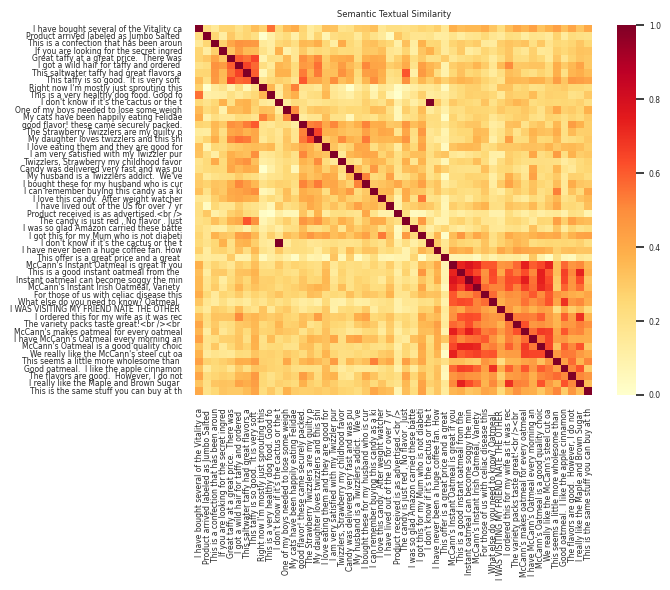

In [9]:
#@title Vizualization Semantic Textual Similarity
#@markdown The embeddings produced by the Universal Sentence Encoder are approximately normalized. The semantic similarity of two sentences can be trivially computed as the inner product of the encodings.

number_of_records = 50 #@param {type:"integer"}

def plot_similarity(labels, features, rotation):
  corr = np.inner(features, features)
  sns.set(font_scale=0.5)
  g = sns.heatmap(
      corr,
      xticklabels=labels,
      yticklabels=labels,
      vmin=0,
      vmax=1,
      cmap="YlOrRd")
  g.set_xticklabels(labels, rotation=rotation)
  g.set_title("Semantic Textual Similarity")

def embed_and_vizualize_similarity(messages_):
  message_embeddings_ = embed(messages_)
  plot_similarity(list(map(lambda s: s[:40], messages_)), message_embeddings_, 90)

embed_and_vizualize_similarity(df.Text.values[:number_of_records])

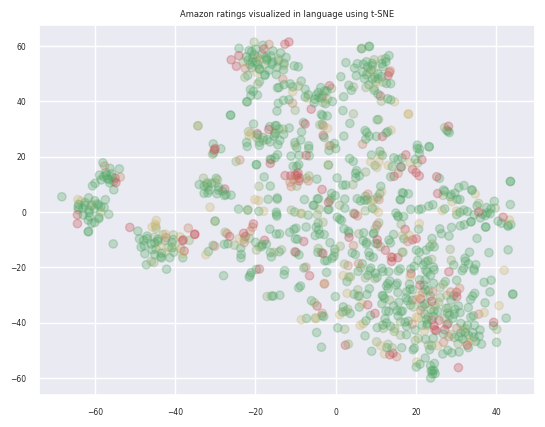

In [10]:
#@title t-SNE vizualization of text embeddings
number_of_records = 1000 #@param {type:"integer"}
learning_rate = 1000 #@param {type:"integer"}

from sklearn.manifold import TSNE

import matplotlib.pyplot as plt
import matplotlib


def embed_and_vizualize_tsne(messages_,scores_):
  message_embeddings_ = embed(messages_)

  # Create a t-SNE model and transform the data
  tsne = TSNE(n_components=2, perplexity=15, random_state=42, init='random', learning_rate=learning_rate)
  vis_dims = tsne.fit_transform(message_embeddings_)

  # Get x and y values
  x = [x for x,y in vis_dims]
  y = [y for x,y in vis_dims]

  # ColorMap for each score
  color_indices = scores_ - 1
  colormap = matplotlib.colors.LinearSegmentedColormap.from_list('rg', ["r", "y", "g"])

  # Draw
  plt.scatter(x, y, c=color_indices, cmap=colormap, alpha=0.3)
  plt.title("Amazon ratings visualized in language using t-SNE")

embed_and_vizualize_tsne(df.Text.values[:number_of_records], df.Score.values[:number_of_records])

In [11]:
#@title Vizualization of text embeddings in tensorboard
number_of_records = 1000 #@param {type:"integer"}

from tensorboard.plugins import projector
import csv

log_dir='/logs/tensorboard/'
metadata_file = 'metadata.tsv'
checkpoint_file = 'embedding.ckpt'

def save_embeddings(embeddings_):
  weights = tf.Variable(embeddings_)
  checkpoint = tf.train.Checkpoint(embedding=weights)
  checkpoint.save(os.path.join(log_dir, checkpoint_file))

def save_metadata(scores_, messages_):
  with open(os.path.join(log_dir, metadata_file), "w") as f:
    fieldnames = ['Score', 'Label']
    writer = csv.DictWriter(f, delimiter = "\t", fieldnames=fieldnames)
    writer.writeheader()
    for score, label in zip(scores_, messages_):
        writer.writerow({'Score': score, 'Label': label})

def setup_config():
  config = projector.ProjectorConfig()
  embedding = config.embeddings.add()
  embedding.tensor_name = "embedding/.ATTRIBUTES/VARIABLE_VALUE"
  embedding.metadata_path = metadata_file
  projector.visualize_embeddings(log_dir, config)

def embed_and_vizualize(messages_, scores_):
  message_embeddings_ = embed(messages_)
  save_embeddings(message_embeddings_)
  save_metadata(scores_, messages_)
  setup_config()


!rm -rf {log_dir}

embed_and_vizualize(df.Text.values[:number_of_records], df.Score.values[:number_of_records])

In [12]:
%load_ext tensorboard

In [13]:
#@title Start tensorboard server
%tensorboard --logdir {log_dir}

<IPython.core.display.Javascript object>

Saving colab.research.google.com_drive_1bDN80aaIZTbg1cRxpFVeu_9-fSB6qxRM.jpg to colab.research.google.com_drive_1bDN80aaIZTbg1cRxpFVeu_9-fSB6qxRM.jpg


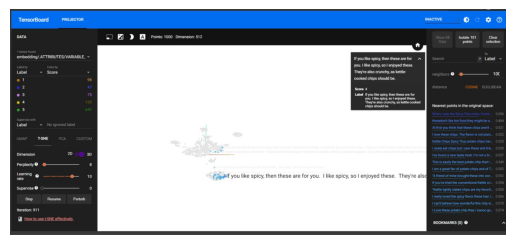

In [5]:
#@title Example screenshot from Tensorboard
# uncomment next line to enable
%%script false --no-raise-error

from google.colab import files
import cv2
from matplotlib import pyplot as plt

uploaded = files.upload()
filename = list(uploaded.keys())[0]

img_color = cv2.imread(filename,1)

plt.imshow(img_color)
plt.axis("off")
plt.show()

In [22]:
#@title Download Logs
# uncomment next line to enable
%%script false --no-raise-error

!rm -rf /logs.zip
!zip -r /logs.zip /logs/

from google.colab import files
files.download('/logs.zip') 